In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.patches as patches

import os
os.chdir("/Users/deweywang/Desktop/GitHub/HEVisum/")


# Training data preparation 

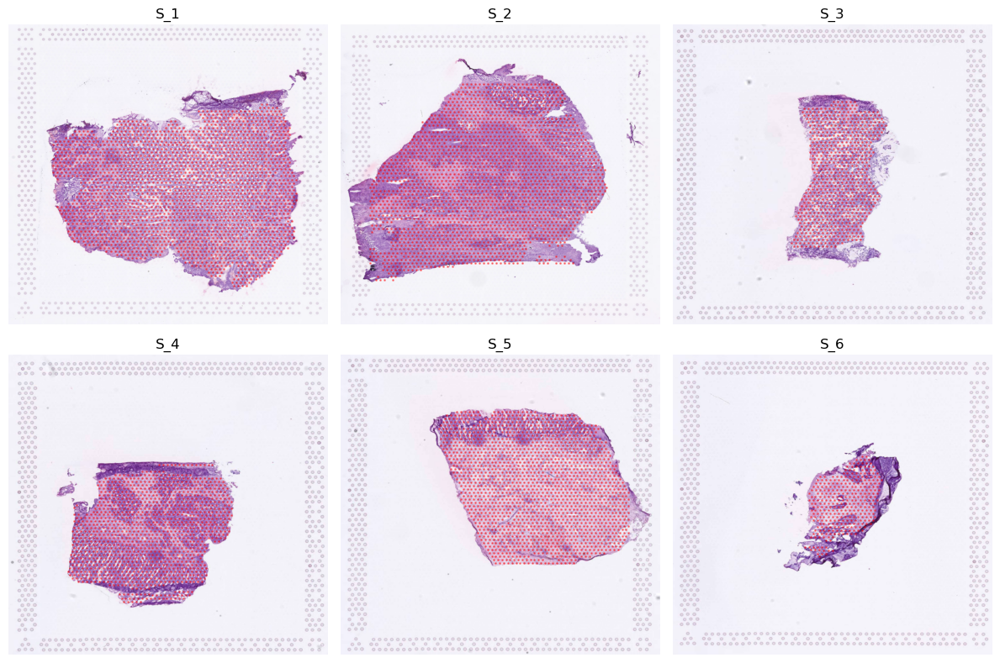

In [42]:
import math
import numpy as np
import h5py
import matplotlib.pyplot as plt

# Open the HDF5 file and load the Train images and spots datasets
with h5py.File("dataset/realign/original_data.h5", "r") as h5file:
    train_images = h5file["images/Train"]
    train_spots = h5file["spots/Train"]

    # Get a list of all sample keys (slide identifiers)
    samples = list(train_images.keys())
    n_samples = len(samples)
    
    # Determine grid size (roughly square)
    cols = math.ceil(math.sqrt(n_samples))
    rows = math.ceil(n_samples / cols)
    
    # Create a figure with a grid of subplots
    fig, axs = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    # In case there's only one subplot, make it iterable
    axs = axs.flatten() if n_samples > 1 else [axs]
    
    # Loop through each sample and plot the corresponding data
    for ax, sample in zip(axs, samples):
        image = np.array(train_images[sample])
        spots = np.array(train_spots[sample])
        x, y = spots["x"], spots["y"]

        ax.imshow(image, aspect="auto")
        ax.scatter(x, y, color="red", s=1, alpha=0.4)
        ax.axis('off')
        ax.set_title(sample)
        
    # Hide any unused subplots (if the grid is larger than needed)
    for ax in axs[len(samples):]:
        ax.set_visible(False)
    
    plt.tight_layout()
    plt.show()


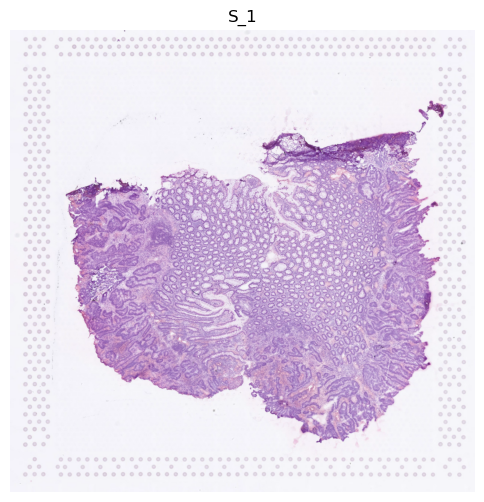

In [6]:
with h5py.File("./dataset/elucidata_ai_challenge_data.h5", "r") as h5file:
    train_images = h5file["images/Train"]
    train_spots = h5file["spots/Train"]
    
    sample = 'S_1'
    image = np.array(train_images[sample])
    spots = np.array(train_spots[sample])
    x, y = spots["x"], spots["y"]
    
    plt.figure(figsize=(6,6))
    plt.imshow(image, aspect="auto")
    #plt.scatter(x, y, color="red", s=1, alpha=0.4)
    plt.axis('off')
    plt.title(sample)
    plt.show()

## Training data augmentation

In [13]:

# Load and display (x,y) spot locations and cell type annotation table for Train slides
with h5py.File("dataset/spots-data/version-5/no_clip_gu_processed_train_spots.h5", "r") as f:
    train_spots = f["spots/log2_Train"]
    
    # Dictionary to store DataFrames for each slide
    train_spot_tables = {}
    
    for slide_name in train_spots.keys():
        # Load dataset as NumPy structured array
        spot_array = np.array(train_spots[slide_name])
        
        # Convert to DataFrame
        df = pd.DataFrame(spot_array)
        
        # Store in dictionary
        train_spot_tables[slide_name] = df
        print(slide_name)

# Example: Display the spots table for slide 'S_1'
train_spot_tables['S_1']

S_1
S_2
S_3
S_4
S_5
S_6


,x,y,zscore_log2_filtered_C1,zscore_log2_filtered_C2,zscore_log2_filtered_C3,zscore_log2_filtered_C4,zscore_log2_filtered_C5,zscore_log2_filtered_C6,zscore_log2_filtered_C7,zscore_log2_filtered_C8,...,zscore_log2_filtered_C26,zscore_log2_filtered_C27,zscore_log2_filtered_C28,zscore_log2_filtered_C29,zscore_log2_filtered_C30,zscore_log2_filtered_C31,zscore_log2_filtered_C32,zscore_log2_filtered_C33,zscore_log2_filtered_C34,zscore_log2_filtered_C35
0,1554,1297,-0.603246,-0.435053,-0.570764,-0.523795,-0.099760,3.204404,-0.510432,0.094953,...,-0.305204,2.848441,1.402928,-0.296408,-0.332695,-0.511507,-0.463607,1.016321,-0.414690,-0.126646
1,462,1502,-0.472097,0.537761,-0.435851,-0.440353,2.367270,-0.435736,0.704734,-0.239895,...,-0.308130,-0.437272,-0.349912,-0.190341,-0.332661,0.804120,0.133164,-0.323027,-0.372806,-0.133392
2,1488,1548,-0.451260,-0.597028,-0.509482,-0.520947,0.435508,-0.426691,-0.606394,-0.269383,...,-0.313622,-0.065456,-0.332085,-0.339042,-0.332745,-0.610033,-0.627723,-0.321262,-0.431268,-0.547821
3,1725,1182,-0.507545,0.783093,-0.465677,-0.498563,3.032796,0.061907,1.986766,-0.084806,...,-0.296417,-0.084218,-0.322369,-0.046703,-0.332668,0.549885,1.008421,-0.326952,-0.408791,0.636778
4,581,1113,-0.457100,-0.369337,-0.452923,-0.431558,1.693930,-0.459043,-0.331140,-0.262851,...,-0.313842,-0.462315,-0.352820,-0.302713,-0.329262,-0.387886,-0.499462,-0.371378,-0.436306,-0.575556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,1055,701,-0.559557,-0.035907,-0.523094,-0.522988,-0.822538,0.859183,-0.051017,-0.025274,...,-0.245349,0.840260,1.853422,0.464063,-0.332718,-0.400502,0.243815,-0.333868,-0.359414,0.773478
2145,1225,862,-0.529086,0.010395,-0.318391,-0.524762,-0.817576,1.381010,-0.164811,-0.196401,...,-0.022436,1.037405,1.027586,0.481288,-0.332743,-0.404575,0.301893,-0.034465,-0.180014,2.424530
2146,765,1479,-0.379121,-0.505304,-0.379173,-0.521146,-0.633435,-0.462212,-0.666774,-0.270042,...,-0.312083,-0.479030,-0.353219,-0.343369,-0.332545,-0.570993,-0.616454,-0.372220,-0.436102,-0.654025
2147,607,1525,-0.618791,0.235444,-0.580484,-0.527196,0.625895,-0.462452,-0.449127,-0.248086,...,-0.301817,-0.468716,-0.331791,0.199688,-0.329564,-0.229333,0.248507,-0.261475,-0.436571,-0.420523


## Smooth spots

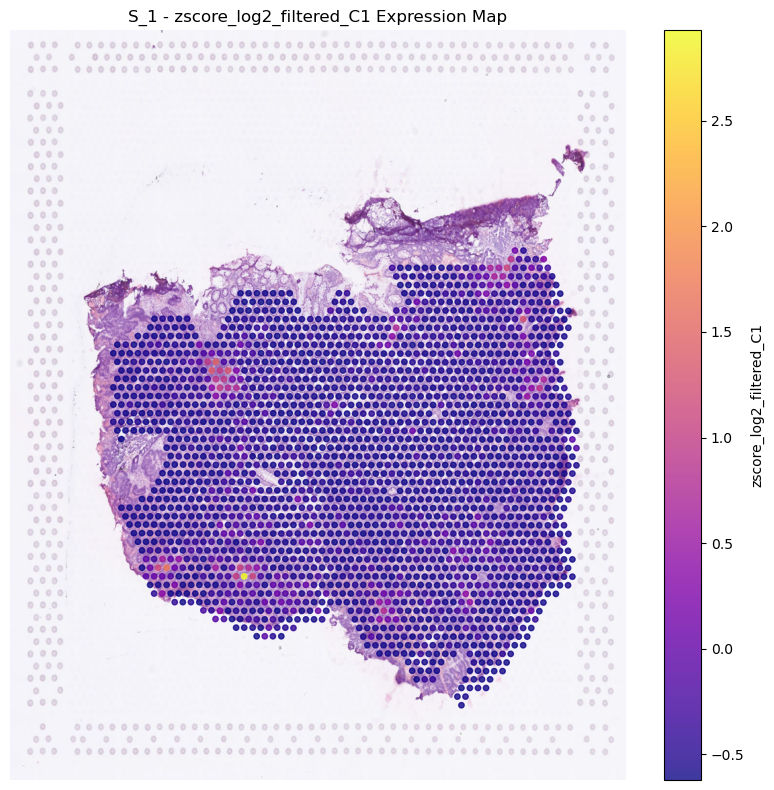

In [2]:
from python_scripts.expression_plot_utils import plot_cell_expression_on_slide
plot_cell_expression_on_slide(
    slide_id = "S_1",
    cell_type = "C1",
    cell_prefix="zscore_log2_filtered_",  # or zscore_boxcox_filtered_
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="dataset/spots-data/version-5/no_clip_gu_processed_train_spots.h5",
    group_name="log2_Train"
)

/Users/deweywang/Desktop/GitHub/HEVisum/python_scripts/expression_plot_utils.py:241: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.93, 0.97])


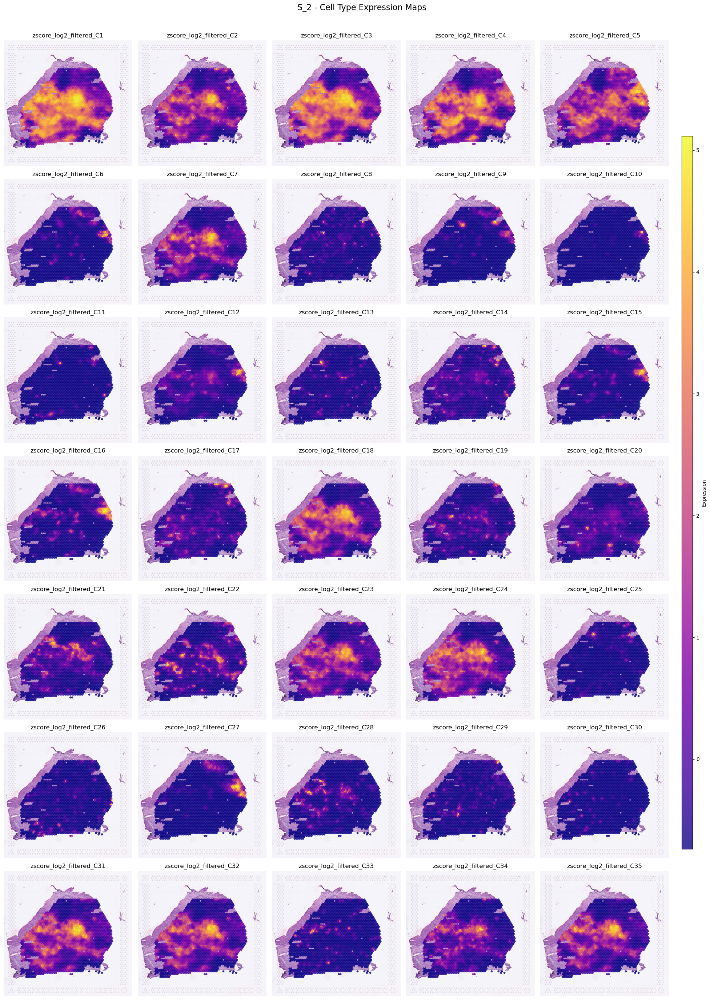

In [42]:
from python_scripts.expression_plot_utils import plot_all_celltypes_on_slide
plot_all_celltypes_on_slide(
    slide_id = "S_2",
    cell_prefix="zscore_log2_filtered_",
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path_h5="./dataset/spots-data/version-5/gu_smooth_radius30.h5",
    spot_group="log2_Train",
    image_group="Train")



Train S_1
Train S_2
Train S_3
Train S_4
Train S_5
Train S_6


/var/folders/7g/j5s0yzcj34l3v043s7znkplc0000gn/T/ipykernel_70894/1039634866.py:141: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.93, 1])
/var/folders/7g/j5s0yzcj34l3v043s7znkplc0000gn/T/ipykernel_70894/1039634866.py:141: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 0.93, 1])


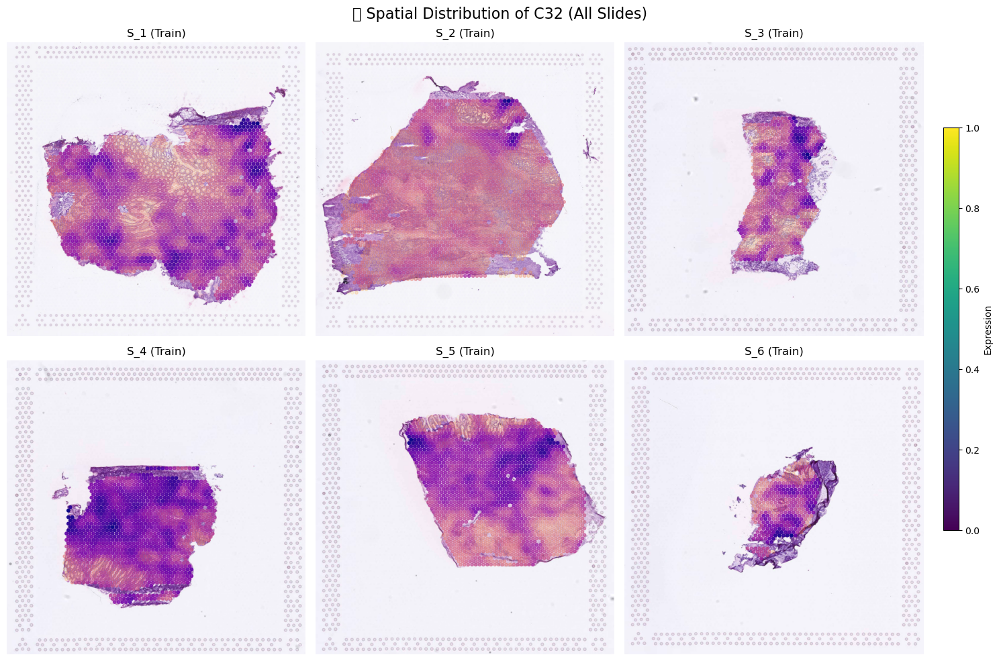

In [37]:
plot_cell_expression_all_slides(
    cell_short_name='C32',
    cell_prefix='rank_',
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="dataset/realign/gu_rank_radius50.h5",
    group_name="Train"
)

# gu_smooth_processed_train_spots_log2 , log2_filtered_
# gu_smooth_processed_train_spots , zscore_log2_filtered_

In [24]:

def plot_cell_expression_all_slides(
    cell_short_name='C17',
    cell_prefix='zscore_log2_filtered_',
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="dataset/spots-data/version-4/gu_zscore_processed_train_spots.h5",  # 用於 Train 組的 spots與表達量
    group_name="log2_Train",                          # 用於 Train 組，Test 依然用相同欄位名稱（但 Test 的 CSV 只有 "C*"）
    dataset_type="Train",                             # 如果不輸入 submission_spot_data，僅顯示此組
    submission_spot_data=None                         # 如果有，則同時顯示 Train 與 Test
):
    import matplotlib.pyplot as plt
    import numpy as np
    import h5py
    import pandas as pd
    import math
    import os

    # 為 Train 組，建立 full_col_name；而對於 Test 組的 submission 資料則直接用 cell_short_name
    full_col_name = cell_prefix + cell_short_name

    # 如果 submission_spot_data 有值，則要顯示 Train 與 Test 兩組；否則只顯示指定的 dataset_type
    if submission_spot_data is not None:
        groups_to_plot = ["Train", "Test"]
    else:
        groups_to_plot = [dataset_type]

    results = []  # 儲存每個 slide 的資料

    for grp in groups_to_plot:
        # 讀取該組所有 slide id（從圖像部分）
        with h5py.File(image_path, "r") as img_h5:
            slide_ids = list(img_h5[f"images/{grp}"].keys())
        for slide in slide_ids:
            # ---------- 讀取圖像 ----------
            with h5py.File(image_path, "r") as h5file:
                img = np.array(h5file[f"images/{grp}"][slide])
            # ---------- 讀取 spots 座標 ----------
            # Train 組從 HDF5 的 spot_path 讀取；Test 組則從 image_path 同一檔案讀取
            if grp == "Train":
                with h5py.File(spot_path, "r") as sp_h5:
                    print(grp, slide)
                    spots = np.array(sp_h5[f"spots/{group_name}"][slide])
                    x = spots["x"]
                    y = spots["y"]
            else:
                with h5py.File(image_path, "r") as h5file:
                    spots = np.array(h5file[f"spots/{grp}"][slide])
                    x = spots["x"]
                    y = spots["y"]

            # ---------- 讀取表達量資料 ----------
            if grp == "Train":
                # Train 組：從 HDF5 讀取 spot 資料
                with h5py.File(spot_path, "r") as sp_h5:
                    df = pd.DataFrame(np.array(sp_h5[f"spots/{group_name}"][slide]))
                # 對 Train 組採用 full_col_name
                target_col = full_col_name
            else:
                # Test 組：如果有 submission_spot_data，就用它
                if submission_spot_data is not None:
                    if isinstance(submission_spot_data, str) and os.path.isfile(submission_spot_data):
                        df_test = pd.read_csv(submission_spot_data)
                        # 如果有 slide_id 欄位就過濾
                        if "slide_id" in df_test.columns:
                            df = df_test[df_test["slide_id"] == slide]
                        else:
                            df = df_test.copy()
                    elif isinstance(submission_spot_data, pd.DataFrame):
                        df_test = submission_spot_data.copy()
                        if "slide_id" in df_test.columns:
                            df = df_test[df_test["slide_id"] == slide]
                        else:
                            df = df_test.copy()
                    else:
                        raise ValueError("submission_spot_data 必須為 CSV 路徑或 pandas DataFrame。")
                    # 對於 Test 的 submission 資料，欄位名稱固定為 cell_short_name（如 "C17"）
                    target_col = cell_short_name
                else:
                    # Test 組但沒有 submission_spot_data，則從 HDF5 讀取
                    with h5py.File(spot_path, "r") as sp_h5:
                        df = pd.DataFrame(np.array(sp_h5[f"spots/{group_name}"][slide]))
                    target_col = full_col_name

            # ---------- 驗證表達量資料行數與座標數是否一致 ----------
            if df.shape[0] != len(x):
                print(f"⚠️ In slide {slide} ({grp}): 資料行數 {df.shape[0]} 與座標數 {len(x)} 不一致，跳過")
                continue

            results.append({
                "group": grp,
                "slide": slide,
                "image": img,
                "df": df,
                "x": x,
                "y": y,
                "target_col": target_col
            })

    if len(results) == 0:
        raise ValueError("沒有符合條件的 slide 進行繪圖。")

    # ---------- 建立整體子圖畫布 ----------
    n = len(results)
    cols = 3
    rows = math.ceil(n / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(5*cols,5*rows))
    axes = axes.flatten()
    used = 0

    for res in results:
        ax = axes[used]; used += 1
        img = res["image"]; df = res["df"]
        x, y = res["x"], res["y"]; col = res["target_col"]
        expr = df[col].values.astype(float)

        # ---- 关键部分：根据 expr 动态算 alpha ----
        # 1) 归一化到 [0,1]
        if expr.max() > expr.min():
            expr_norm = (expr - expr.min()) / (expr.max() - expr.min())
        else:
            expr_norm = np.zeros_like(expr)
        # 2) alpha = 1 - expr_norm*0.9 -> [1, 0.1]
        alphas = 1.0 - expr_norm * 1

        # 3) 用 colormap 拿到 RGBA，并替换 alpha 通道
        cmap = plt.get_cmap("plasma")
        norm  = plt.Normalize(expr.min(), expr.max())
        colors = cmap(norm(expr))
        colors[:, 3] = alphas  # 覆盖透明度

        # ---- 绘图 ----
        ax.imshow(img, aspect="auto")
        sc = ax.scatter(x, y, color=colors, s=10)
        ax.set_title(f"{res['slide']} ({res['group']})")
        ax.axis("off")

    
    fig.subplots_adjust(right=0.92)
    cbar_ax = fig.add_axes([0.94, 0.2, 0.015, 0.6])
    fig.colorbar(sc, cax=cbar_ax, label='Expression')
    plt.suptitle(f"🔬 Spatial Distribution of {cell_short_name} (All Slides)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

Train S_1
Train S_2
Train S_3
Train S_4
Train S_5
Train S_6


/var/folders/7g/j5s0yzcj34l3v043s7znkplc0000gn/T/ipykernel_70894/1039634866.py:141: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.93, 1])
/var/folders/7g/j5s0yzcj34l3v043s7znkplc0000gn/T/ipykernel_70894/1039634866.py:141: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 0.93, 1])


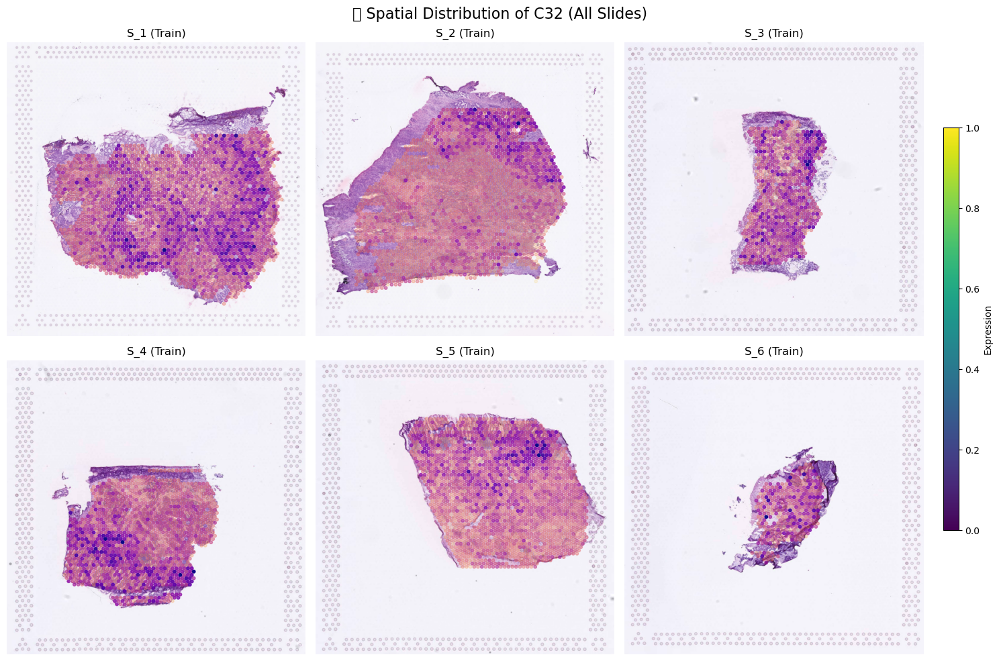

In [28]:
plot_cell_expression_all_slides(
    cell_short_name='C32',
    cell_prefix='rank_',
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="dataset/spot-rank/version-1/directly_rank_train_spots_v2.h5",
    group_name="Train"
)

# gu_smooth_processed_train_spots_log2 , log2_filtered_
# gu_smooth_processed_train_spots , zscore_log2_filtered_

In [33]:
import h5py
import numpy as np
from python_scripts.spatial_smooth import smooth_all_slides_and_save

# 先載入原本的資料（跟你之前一樣）
with h5py.File("dataset/realign/log2_nor_rank_spots.h5", "r") as f:
    train_spots = f["spots/Train"]
    train_spot_tables = {
        slide: pd.DataFrame(np.array(train_spots[slide]))
        for slide in train_spots.keys()
    }

# 找出所有 cell type 欄位（z-score 後的）
cell_type_cols = [col for col in train_spot_tables["S_1"].columns if col.startswith("rank_")]

# 設定儲存路徑
save_folder = "dataset/realign/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)
    
smoothed_path = os.path.join(save_folder, "gu_rank_radius78.h5")


smooth_all_slides_and_save(train_spot_tables, cell_type_cols, smoothed_path, radius=78)


Processing slides: 100%|██████████| 6/6 [00:03<00:00,  1.52it/s]

✅ 所有 slide 都已平滑並存成 dataset/realign/gu_rank_radius78.h5，格式與 processed_train_spots.h5 相同！


/var/folders/7g/j5s0yzcj34l3v043s7znkplc0000gn/T/ipykernel_70894/403578373.py:40: UserWarning: image is size 3 on the last axis, but channel_axis is None. If this is a color image, please set channel_axis=-1 for proper noise estimation.
  n2 = estimate_sigma(img_u8, average_sigmas=True)


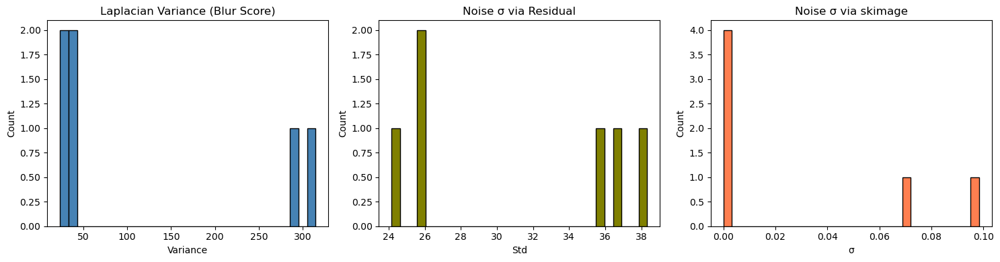

推荐对 blur < 25.6 的样本加 GaussianNoise
推荐对 noise > 0.085 的样本加 GaussianBlur


In [38]:
import math
import numpy as np
import h5py
from skimage import img_as_float
from skimage.filters import gaussian, laplace
from skimage.restoration import estimate_sigma
import matplotlib.pyplot as plt

def estimate_blur(img_gray):
    """Laplacian 方差评估模糊度，支持 float32/64"""
    # 如果是彩色，先转灰度
    if img_gray.ndim == 3:
        img_gray = np.dot(img_gray[..., :3], [0.2989, 0.5870, 0.1140])
    lap = laplace(img_gray)
    return lap.var()

def estimate_noise_std(img_gray):
    """残差法估计噪声强度"""
    smooth = gaussian(img_gray, sigma=1)
    residual = img_gray - smooth
    return residual.std()

# 1) 遍历所有 slide，收集 blur_score 和 noise_std
blur_scores = []
noise_residual = []
noise_skimg = []
slide_ids = []

with h5py.File("./dataset/elucidata_ai_challenge_data.h5", "r") as h5file:
    train_images = h5file["images/Train"]
    slide_ids = list(train_images.keys())

    blur_scores, noise_residual, noise_skimg = [], [], []
    for sid in slide_ids:
        img_f = img_as_float(train_images[sid][()])      # float[0,1]
        img_u8 = (img_f * 255).round().astype(np.uint8)  # uint8 [0,255]

        b  = estimate_blur(img_u8)                       # now on 0–255
        n1 = estimate_noise_std(img_u8)
        n2 = estimate_sigma(img_u8, average_sigmas=True)

        blur_scores.append(b)
        noise_residual.append(n1)
        noise_skimg.append(n2)


# 2) 绘制直方图，观察分布
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].hist(blur_scores, bins=30, color='steelblue', edgecolor='k')
axes[0].set_title("Laplacian Variance (Blur Score)")
axes[0].set_xlabel("Variance")
axes[0].set_ylabel("Count")

axes[1].hist(noise_residual, bins=30, color='olive', edgecolor='k')
axes[1].set_title("Noise σ via Residual")
axes[1].set_xlabel("Std")
axes[1].set_ylabel("Count")

axes[2].hist(noise_skimg, bins=30, color='coral', edgecolor='k')
axes[2].set_title("Noise σ via skimage")
axes[2].set_xlabel("σ")
axes[2].set_ylabel("Count")

plt.tight_layout()
plt.show()

# 3) 建议阈值（例如取最模糊/最噪声的10%）
T_blur  = np.percentile(blur_scores, 10)
T_noise = np.percentile(noise_skimg, 90)
print(f"推荐对 blur < {T_blur:.1f} 的样本加 GaussianNoise")
print(f"推荐对 noise > {T_noise:.3f} 的样本加 GaussianBlur")


In [3]:
df

,ID,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,C26,C27,C28,C29,C30,C31,C32,C33,C34,C35
0,0,287.31210,433.06640,282.62598,65.561775,152.73628,133.65227,217.86028,160.947540,228.71333,...,238.506070,152.39397,140.483140,117.68686,363.705200,351.03757,319.70554,171.672620,117.146614,240.76112
1,1,495.36597,387.25820,481.80704,368.437650,514.55695,130.20485,265.98846,76.242546,147.36276,...,101.752150,116.24909,66.533806,133.78696,65.501110,373.82056,334.17767,110.705760,167.454830,272.41107
2,2,446.73290,332.82922,435.48138,355.876830,457.53488,217.02357,229.58572,66.118195,262.19568,...,72.675766,220.07768,71.544136,139.10918,23.033705,317.46950,288.46274,90.035034,131.388410,239.28995
3,3,483.71250,322.62875,464.22300,391.219500,418.54703,319.36435,223.13828,67.635330,390.54562,...,65.934770,345.98257,98.416030,144.66870,-13.578307,303.54970,302.93478,78.363920,144.147400,264.13705
4,4,513.51245,361.47200,493.18900,404.567840,468.19366,332.00604,248.56735,76.655624,407.72186,...,77.631860,358.42065,106.905250,167.99536,-0.381404,338.57736,332.13702,93.724330,153.330170,286.20087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2083,2083,490.80435,337.96380,476.24432,403.193480,474.96550,191.78615,240.10818,63.039100,224.93117,...,71.147220,185.59828,65.910550,118.86963,21.903890,335.63550,301.01154,85.572820,152.901080,252.05730
2084,2084,499.86237,352.57214,482.02063,399.830720,468.47992,295.11910,243.33057,72.439610,360.23657,...,75.226720,312.76483,93.586310,155.46560,4.452912,332.96442,318.54710,91.205310,147.667080,271.82358
2085,2085,476.08990,359.20100,464.32886,373.182430,494.74750,166.33994,250.04478,68.074520,195.52937,...,83.279260,157.07567,65.263610,133.84308,39.026424,347.42343,310.04562,97.326050,152.160830,255.05090
2086,2086,386.33817,377.53732,384.99796,257.695830,487.16590,175.87154,245.96477,81.642334,223.35870,...,99.991870,177.73520,77.011140,181.83359,73.309944,339.59006,302.21330,120.493850,117.202310,238.64730


In [23]:
import os
import glob
import numpy as np
import pandas as pd
import h5py
from sklearn.neighbors import KDTree

# ---------- 1) 配置：修改为你本地的实际路径 ----------
# 如果文件在别的目录，也可以直接写绝对路径
submission_path = "/Users/deweywang/Desktop/GitHub/HEVisum/output_folder/rank-spot/realign/CNN+Res+MLP_version-3/log2_nor_rank/k-fold_v1/only_1-2_v3_try3/submission_fold0.csv"
h5_path         = "dataset/elucidata_ai_challenge_data.h5"  # HDF5 包含 spots/Test
# --------------------------------------------------------

# 2) 载入 submission
submission_df = pd.read_csv(submission_path)
cell_type_cols = [c for c in submission_df.columns if c.startswith("C")]

# 3) 从 HDF5 “spots/Test” 里找到跟 submission 行数一致的 slide
with h5py.File(h5_path, "r") as f:
    test_group = f["spots/Test"]
    slide_name = None
    for s in test_group.keys():
        arr = np.array(test_group[s])
        if len(arr) == len(submission_df):
            slide_name = s
            spot_array = arr
            break
    if slide_name is None:
        raise RuntimeError("在 spots/Test 下没有找到与 submission 行数相同的 slide")

print(f"Matched Test slide → {slide_name}")

# 4) 构建 spots DataFrame，并把 x,y 合并到 submission
spots_df = pd.DataFrame(spot_array)  # 包含 x,y 字段
# 确保 ID 是整数行号
submission_df["ID"] = submission_df["ID"].astype(int)
submission_df[["x", "y"]] = spots_df.loc[submission_df["ID"], ["x", "y"]].values

# 5) 定义高斯空间平滑函数
def gaussian_spatial_smoothing(df, cell_type_cols, radius=80, sigma=None):
    coords = df[["x", "y"]].values
    tree = KDTree(coords)
    sigma = sigma or (radius / 2)
    smoothed = []
    for i in range(len(df)):
        idxs, dists = tree.query_radius([coords[i]], r=radius, return_distance=True)
        idxs, dists = idxs[0], dists[0]
        if len(idxs) == 0:
            smoothed.append(df.iloc[i][cell_type_cols].values)
            continue
        # 计算高斯权重
        w = np.exp(- (dists**2) / (2 * sigma**2))
        w /= (w.sum() + 1e-8)
        vals = df.iloc[idxs][cell_type_cols].values  # (N, C)
        smoothed.append(np.average(vals, axis=0, weights=w))
    sm = np.vstack(smoothed)
    out = df.copy()
    out[cell_type_cols] = sm
    return out

# 6) 应用平滑
smoothed_df = gaussian_spatial_smoothing(submission_df, cell_type_cols, radius=50)
smoothed_df = smoothed_df.drop(columns=["x", "y"])

# 7) 保存或查看
out_path = os.path.splitext(submission_path)[0] + "_smoothed.csv"
smoothed_df.to_csv(out_path, index=False)
print(f"已保存平滑后的结果到：{out_path}")


Matched Test slide → S_7
已保存平滑后的结果到：/Users/deweywang/Desktop/GitHub/HEVisum/output_folder/rank-spot/realign/CNN+Res+MLP_version-3/log2_nor_rank/k-fold_v1/only_1-2_v3_try3/submission_fold0_smoothed.csv


In [22]:
smoothed_df

,ID,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,C26,C27,C28,C29,C30,C31,C32,C33,C34,C35
0,0,13.528389,14.007132,13.368237,7.402325,9.346270,6.588312,11.330687,8.644176,8.356739,...,10.233615,6.109871,7.880205,7.554845,10.655191,13.384177,12.830996,8.852765,9.033987,11.732694
1,1,15.802301,13.898791,15.426316,12.126802,14.780490,8.388298,11.718491,7.005655,9.168765,...,8.272804,7.552743,6.386704,7.236373,6.105973,13.465492,12.964202,7.552668,9.568081,12.083947
2,2,13.620801,11.336299,13.532672,13.150501,14.000153,11.409999,9.891862,5.453266,12.802964,...,5.601046,10.474900,5.420278,7.295941,2.582946,11.028720,10.755011,5.541937,7.185935,10.257953
3,3,15.899231,12.929651,15.525428,15.115591,15.393737,12.435503,11.228887,6.188566,13.710825,...,6.507681,11.263868,5.966833,7.905575,2.931415,12.554561,12.294823,6.320287,8.659187,11.732390
4,4,15.838444,13.287966,15.486551,14.046252,15.961718,10.978430,11.443986,6.408033,11.998894,...,7.095488,10.031066,5.851593,7.796778,4.009686,12.863681,12.554899,6.774935,8.650944,11.664424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2083,2083,15.648877,12.933589,15.187929,14.264008,15.422624,11.736033,11.178524,6.193901,12.869451,...,6.549753,11.300641,6.031467,7.777665,3.115253,12.490511,12.283387,6.199532,8.502359,11.565028
2084,2084,16.901869,13.660927,16.484124,15.832743,16.290552,11.420311,11.634606,6.136872,12.172954,...,6.937971,9.613847,5.362093,7.295093,3.716031,13.234689,12.797995,6.511610,9.238914,11.998829
2085,2085,16.599410,13.517023,16.129365,14.876068,16.185357,9.962034,11.698227,6.235623,10.549773,...,7.122529,8.864960,5.486170,7.215813,4.012214,13.240120,12.792007,6.685789,9.313074,11.944964
2086,2086,15.650258,14.464471,15.598872,12.515301,14.564385,12.052916,12.831809,8.130291,13.202918,...,8.728241,12.433080,8.414190,10.398171,4.379165,13.937775,13.914743,8.577486,9.927810,13.291001


In [ ]:

# Load and display (x,y) spot locations and cell type annotation table for Train slides
with h5py.File("dataset/elucidata_ai_challenge_data.h5", "r") as f:
    train_spots = f["spots/Test"]
    
    # Dictionary to store DataFrames for each slide
    train_spot_tables = {}
    
    for slide_name in train_spots.keys():
        # Load dataset as NumPy structured array
        spot_array = np.array(train_spots[slide_name])
        
        # Convert to DataFrame
        df = pd.DataFrame(spot_array)
        
        # Store in dictionary
        train_spot_tables[slide_name] = df
        print(slide_name)

# Example: Display the spots table for slide 'S_1'
train_spot_tables['S_7']["Test_Set"] ==2

S_7


{'S_7':          x     y  Test_Set
 0     1499  1260         2
 1     1435  1503         2
 2      558  1082         2
 3      736  1304         1
 4     1257  1592         1
 ...    ...   ...       ...
 2083   736   639         2
 2084  1016   684         2
 2085  1181   839         2
 2086   735  1436         1
 2087   545  1148         2
 
 [2088 rows x 3 columns]}

In [20]:
# 假设已经有了 train_spot_tables
count = (train_spot_tables['S_7']['Test_Set'] == 1).sum()
print(f"S_7 中 Test_Set==2 的 spot 数量：{count}")


S_7 中 Test_Set==2 的 spot 数量：502
